# Esplorazione dei dati

In [1]:
import pandas as pd

df = pd.read_csv('./BankChurners.csv')
print(df.head())

   CLIENTNUM     Attrition_Flag  Customer_Age Gender  Dependent_count  \
0  768805383  Existing Customer            45      M                3   
1  818770008  Existing Customer            49      F                5   
2  713982108  Existing Customer            51      M                3   
3  769911858  Existing Customer            40      F                4   
4  709106358  Existing Customer            40      M                3   

  Education_Level Marital_Status Income_Category Card_Category  \
0     High School        Married     $60K - $80K          Blue   
1        Graduate         Single  Less than $40K          Blue   
2        Graduate        Married    $80K - $120K          Blue   
3     High School        Unknown  Less than $40K          Blue   
4      Uneducated        Married     $60K - $80K          Blue   

   Months_on_book  ...  Credit_Limit  Total_Revolving_Bal  Avg_Open_To_Buy  \
0              39  ...       12691.0                  777          11914.0   
1       

In [2]:
df = df.drop(axis=1, labels="CLIENTNUM")

In [6]:
df.describe().T.round(2)

,count,mean,std,min,25%,50%,75%,max
Customer_Age,10127.0,46.33,8.02,26.0,41.00,46.00,52.00,73.00
Dependent_count,10127.0,2.35,1.30,0.0,1.00,2.00,3.00,5.00
Months_on_book,10127.0,35.93,7.99,13.0,31.00,36.00,40.00,56.00
Total_Relationship_Count,10127.0,3.81,1.55,1.0,3.00,4.00,5.00,6.00
Months_Inactive_12_mon,10127.0,2.34,1.01,0.0,2.00,2.00,3.00,6.00
Contacts_Count_12_mon,10127.0,2.46,1.11,0.0,2.00,2.00,3.00,6.00
Credit_Limit,10127.0,8631.95,9088.78,1438.3,2555.00,4549.00,11067.50,34516.00
Total_Revolving_Bal,10127.0,1162.81,814.99,0.0,359.00,1276.00,1784.00,2517.00
Avg_Open_To_Buy,10127.0,7469.14,9090.69,3.0,1324.50,3474.00,9859.00,34516.00
Total_Amt_Chng_Q4_Q1,10127.0,0.76,0.22,0.0,0.63,0.74,0.86,3.40


In [4]:
df.describe(include=['object']).T

,count,unique,top,freq
Attrition_Flag,10127,2,Existing Customer,8500
Gender,10127,2,F,5358
Education_Level,10127,7,Graduate,3128
Marital_Status,10127,4,Married,4687
Income_Category,10127,6,Less than $40K,3561
Card_Category,10127,4,Blue,9436


## Analisi delle variabili categoriche

In [5]:
categorical_col = df.select_dtypes(include=['object', 'category']).columns.tolist()
print("Variabili categoriche:".upper())
for c in categorical_col:
    print("-", c)

VARIABILI CATEGORICHE:
- Attrition_Flag
- Gender
- Education_Level
- Marital_Status
- Income_Category
- Card_Category


In [6]:
for c in categorical_col:
    print("-------------------------")
    print(f"Colonna: {c.upper()}")
    print(df[c].value_counts())
    print("\n")


-------------------------
Colonna: ATTRITION_FLAG
Attrition_Flag
Existing Customer    8500
Attrited Customer    1627
Name: count, dtype: int64


-------------------------
Colonna: GENDER
Gender
F    5358
M    4769
Name: count, dtype: int64


-------------------------
Colonna: EDUCATION_LEVEL
Education_Level
Graduate         3128
High School      2013
Unknown          1519
Uneducated       1487
College          1013
Post-Graduate     516
Doctorate         451
Name: count, dtype: int64


-------------------------
Colonna: MARITAL_STATUS
Marital_Status
Married     4687
Single      3943
Unknown      749
Divorced     748
Name: count, dtype: int64


-------------------------
Colonna: INCOME_CATEGORY
Income_Category
Less than $40K    3561
$40K - $60K       1790
$80K - $120K      1535
$60K - $80K       1402
Unknown           1112
$120K +            727
Name: count, dtype: int64


-------------------------
Colonna: CARD_CATEGORY
Card_Category
Blue        9436
Silver       555
Gold         116
P

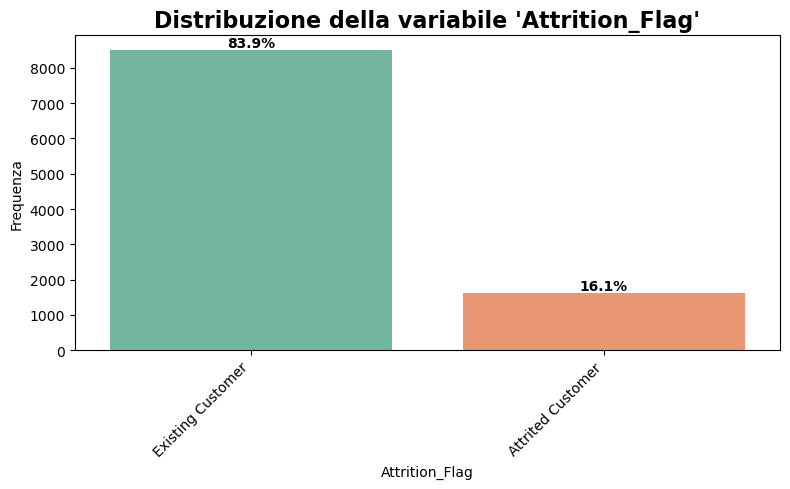

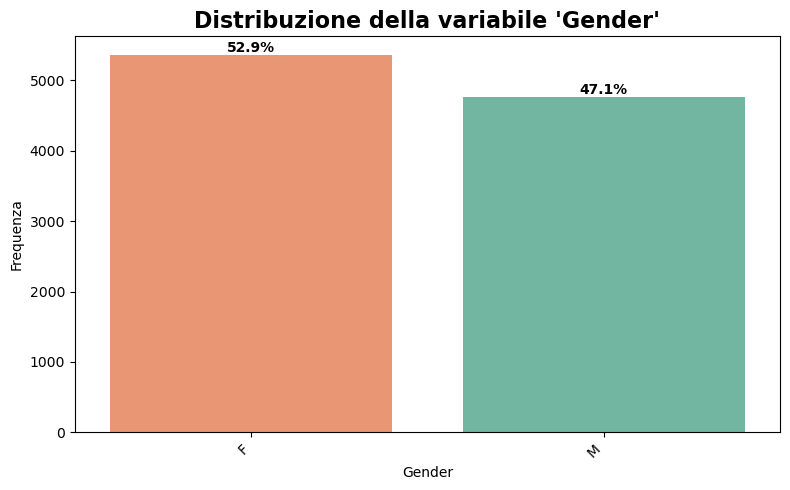

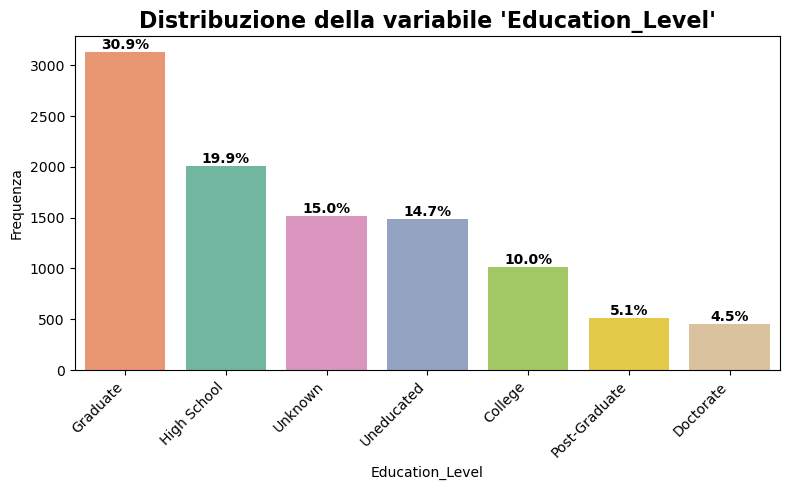

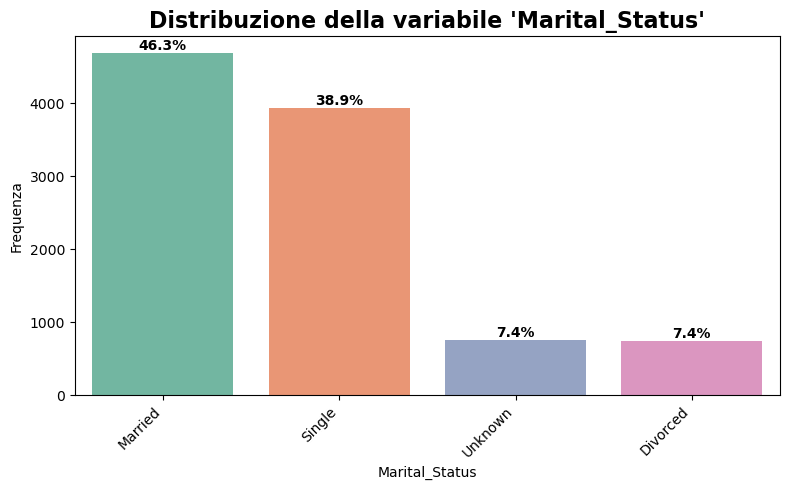

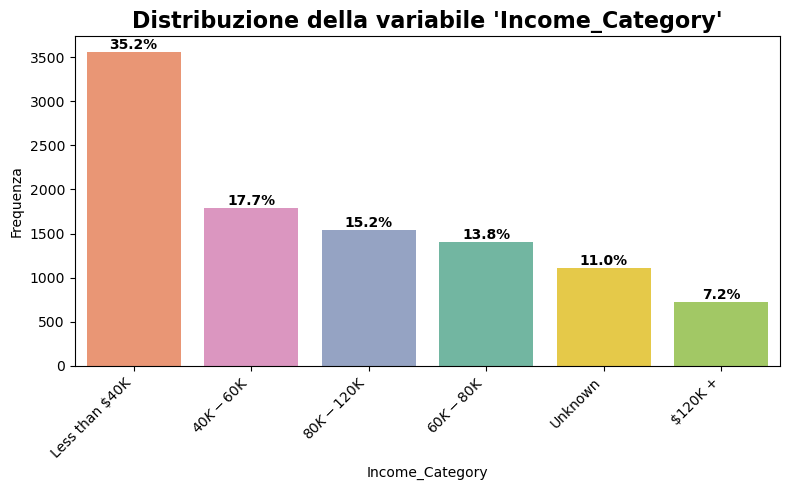

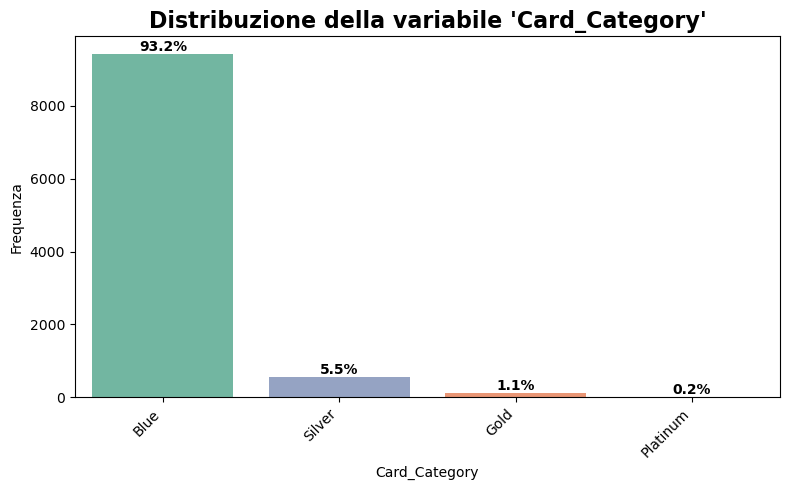

In [8]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

for col in categorical_col:
    plt.figure(figsize=(8, 5))
    order = df[col].value_counts().index

    ax = sns.countplot(data=df, x=col, hue=col, order=order, palette="Set2", legend=False)

    # Titolo più grande e in grassetto
    plt.title(f"Distribuzione della variabile '{col}'", fontsize=16, fontweight='bold')

    # Etichette asse x
    plt.xticks(rotation=45, ha='right')
    plt.xlabel(col)
    plt.ylabel("Frequenza")

    # Aggiungi percentuali sopra ogni barra
    total = len(df)
    for p in ax.patches:
        height = p.get_height()
        percent = f'{100 * height / total:.1f}%'
        ax.annotate(percent, 
                    (p.get_x() + p.get_width() / 2, height), 
                    ha='center', va='bottom', 
                    fontsize=10, fontweight='bold')

    plt.tight_layout()
    plt.show()


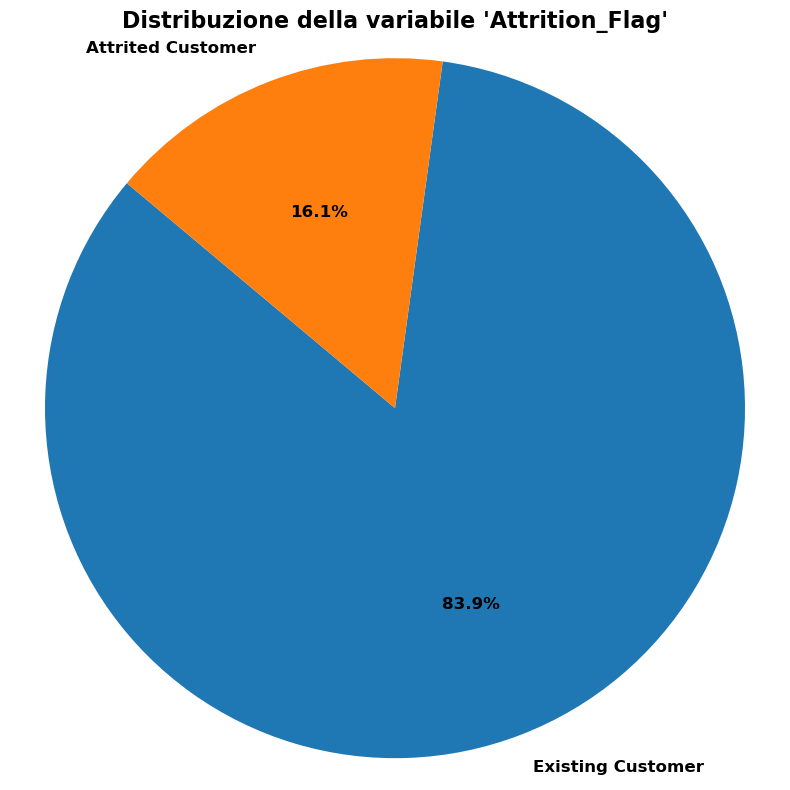

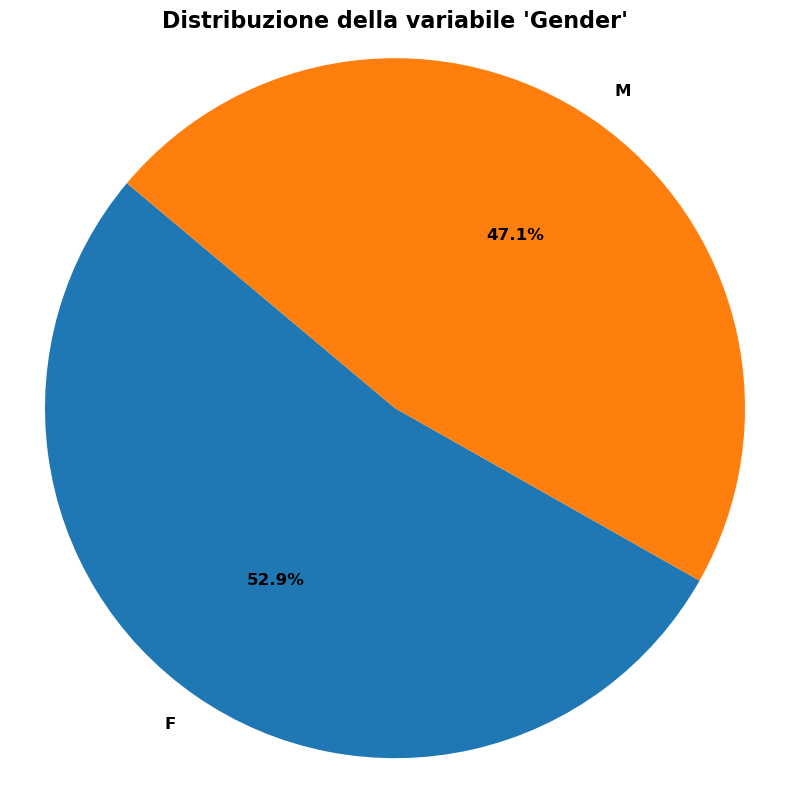

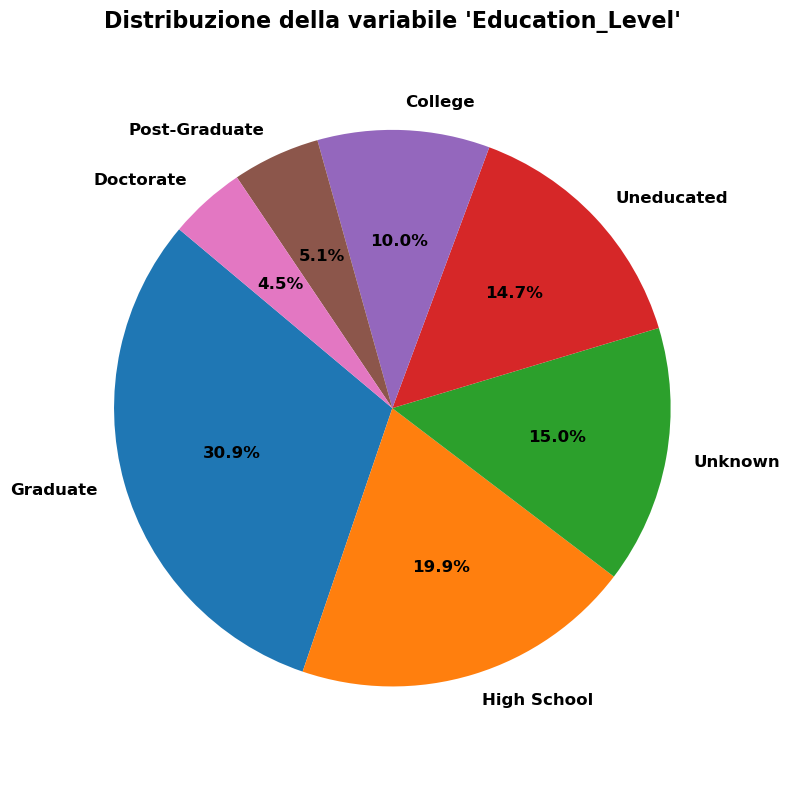

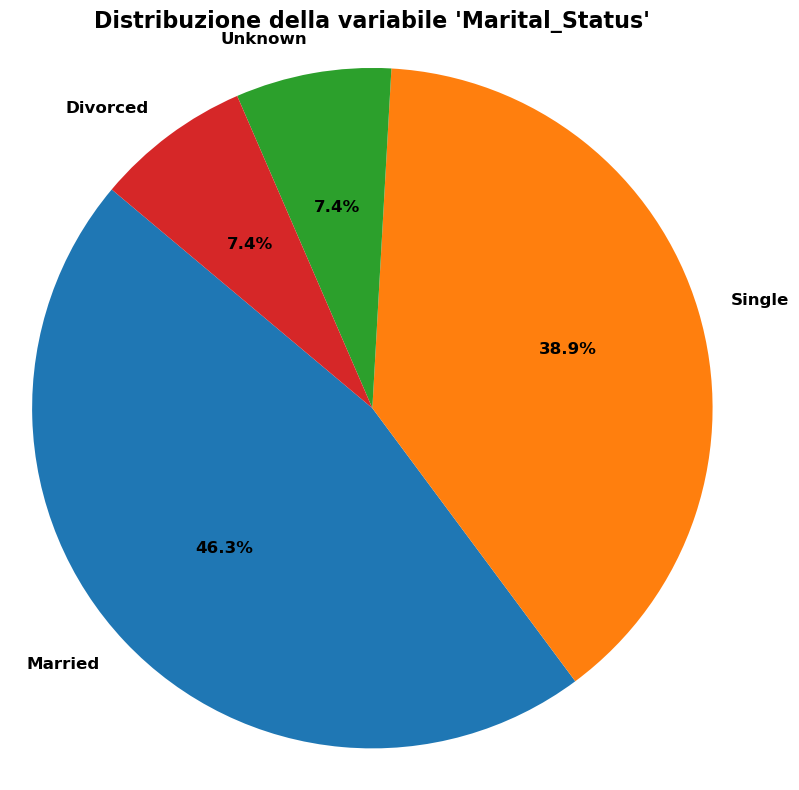

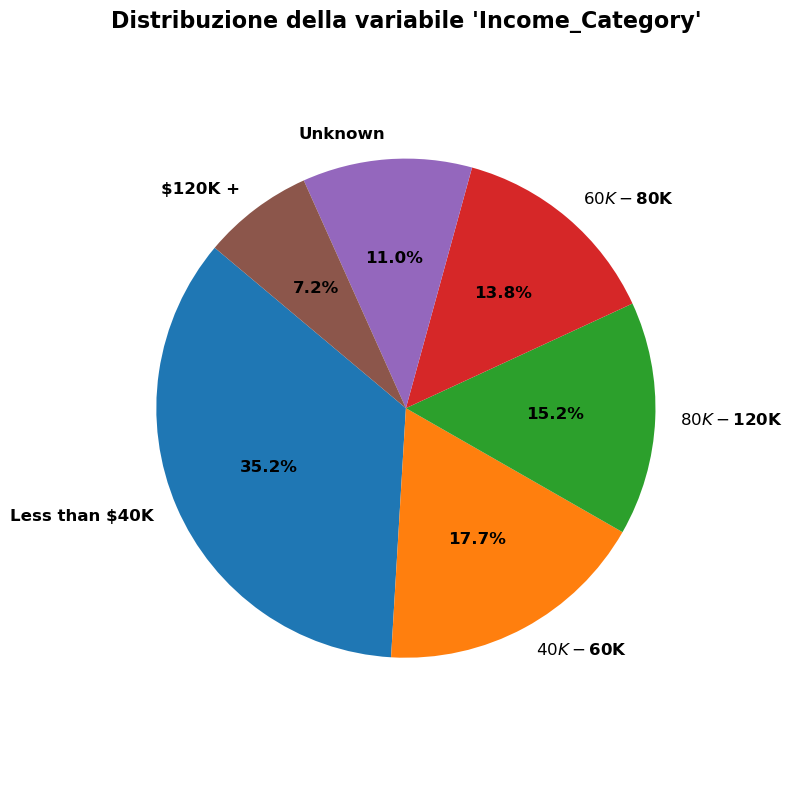

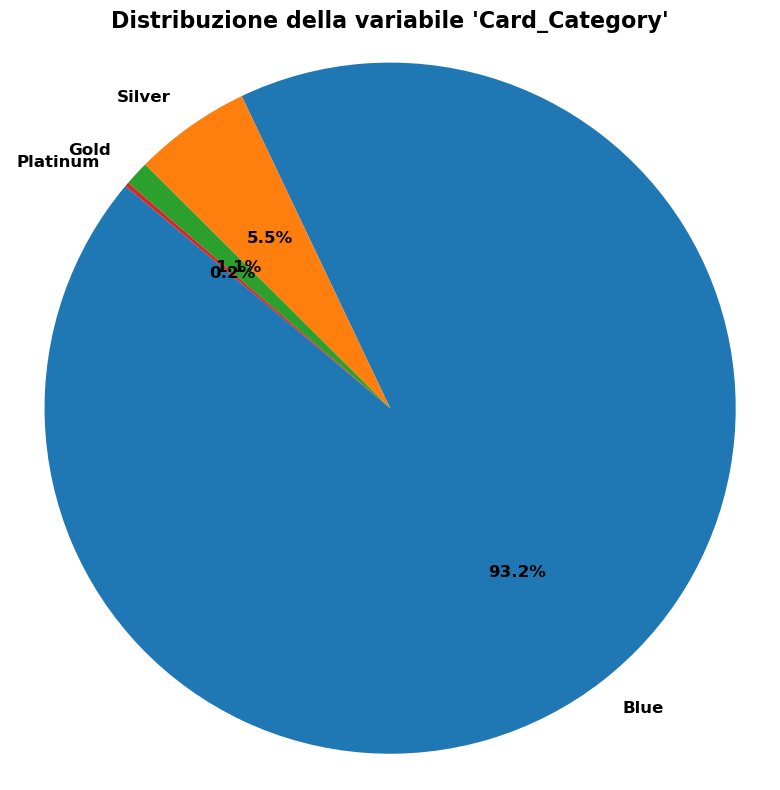

In [8]:
for col in categorical_col:
    plt.figure(figsize=(8, 8))  # dimensione più quadrata per il pie chart

    counts = df[col].value_counts()
    labels = counts.index
    sizes = counts.values

    plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=140, textprops={'fontsize': 12, 'fontweight': 'bold'})

    plt.title(f"Distribuzione della variabile '{col}'", fontsize=16, fontweight='bold')

    plt.axis('equal')  # per rendere la torta circolare e non ellittica
    plt.tight_layout()
    plt.show()


## Analisi delle variabili numeriche

In [9]:
numeric_col = df.select_dtypes(include=['number']).columns.tolist()
print("variabili numeriche:".upper())
for i in numeric_col:
    print("-", i)

VARIABILI NUMERICHE:
- Customer_Age
- Dependent_count
- Months_on_book
- Total_Relationship_Count
- Months_Inactive_12_mon
- Contacts_Count_12_mon
- Credit_Limit
- Total_Revolving_Bal
- Avg_Open_To_Buy
- Total_Amt_Chng_Q4_Q1
- Total_Trans_Amt
- Total_Trans_Ct
- Total_Ct_Chng_Q4_Q1
- Avg_Utilization_Ratio
- Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1
- Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2


In [10]:
# le 2 variabili che contengono le previsioni di un classificatore Naive Bayes 
predicted_col = [numeric_col.pop(14), numeric_col.pop(14)]
predicted_col

['Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1',
 'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2']

In [11]:
numeric_col

['Customer_Age',
 'Dependent_count',
 'Months_on_book',
 'Total_Relationship_Count',
 'Months_Inactive_12_mon',
 'Contacts_Count_12_mon',
 'Credit_Limit',
 'Total_Revolving_Bal',
 'Avg_Open_To_Buy',
 'Total_Amt_Chng_Q4_Q1',
 'Total_Trans_Amt',
 'Total_Trans_Ct',
 'Total_Ct_Chng_Q4_Q1',
 'Avg_Utilization_Ratio']

In [12]:
int_col = ['Dependent_count', 'Total_Relationship_Count', 'Months_Inactive_12_mon', 'Contacts_Count_12_mon']
float_col = [item for item in numeric_col if item not in int_col]
float_col

['Customer_Age',
 'Months_on_book',
 'Credit_Limit',
 'Total_Revolving_Bal',
 'Avg_Open_To_Buy',
 'Total_Amt_Chng_Q4_Q1',
 'Total_Trans_Amt',
 'Total_Trans_Ct',
 'Total_Ct_Chng_Q4_Q1',
 'Avg_Utilization_Ratio']

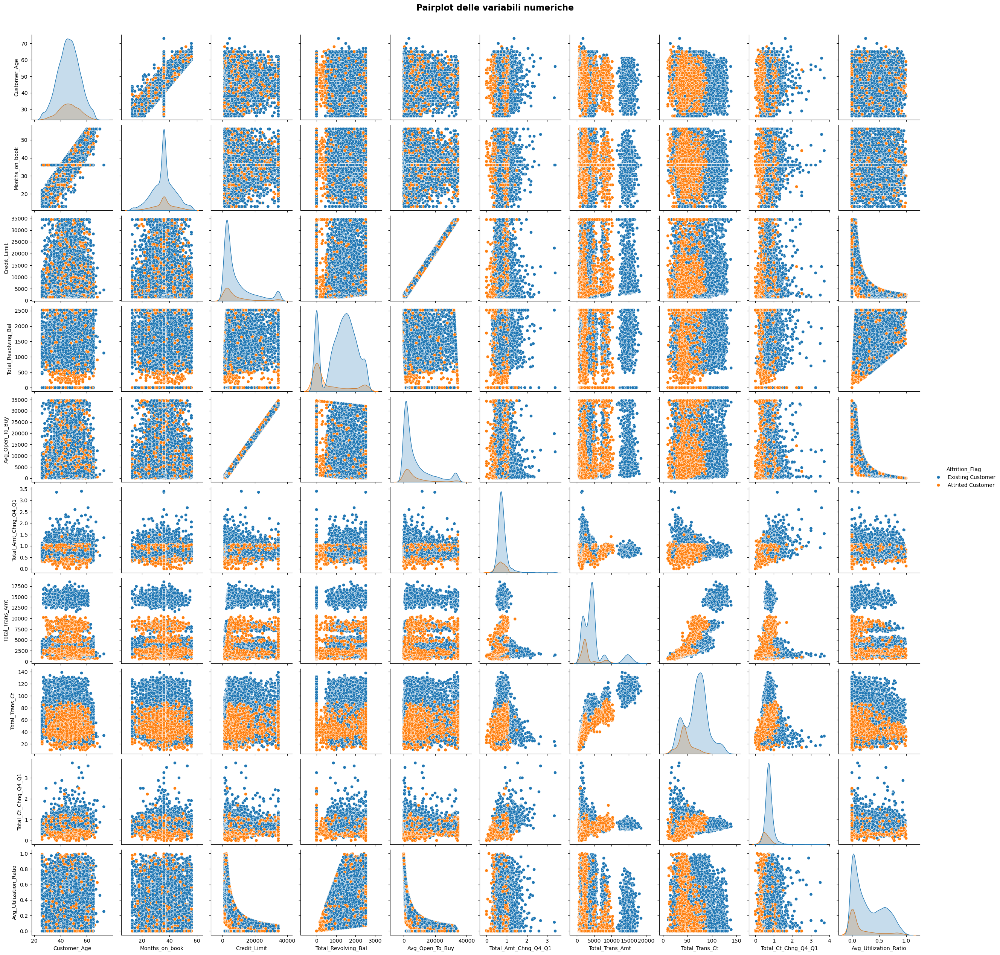

In [13]:
sns.pairplot(df[float_col + ['Attrition_Flag']], hue='Attrition_Flag')
plt.suptitle("Pairplot delle variabili numeriche", fontsize=16, fontweight='bold', y=1.02)
plt.show()

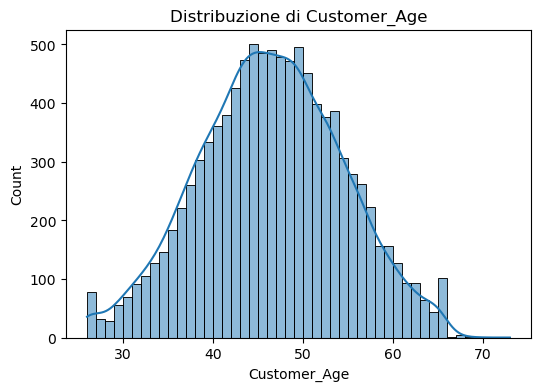

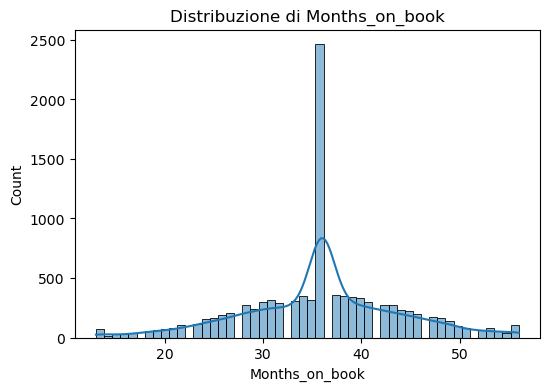

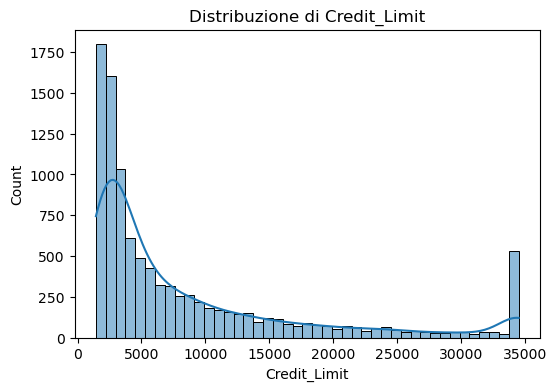

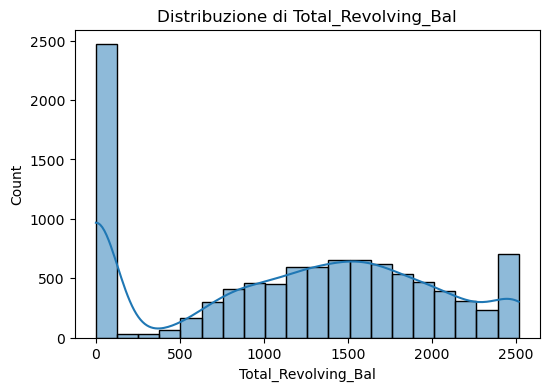

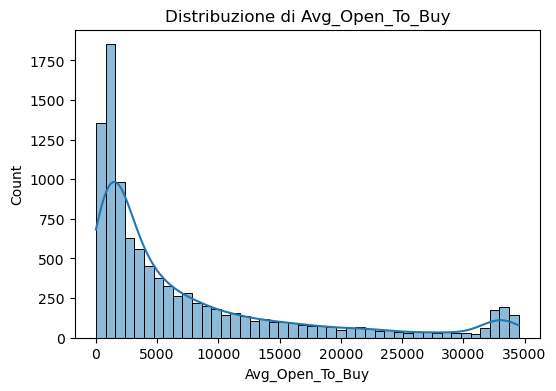

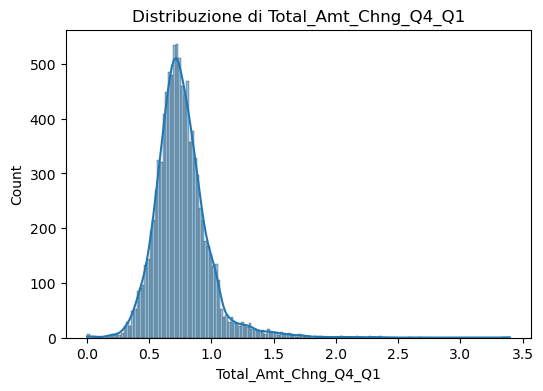

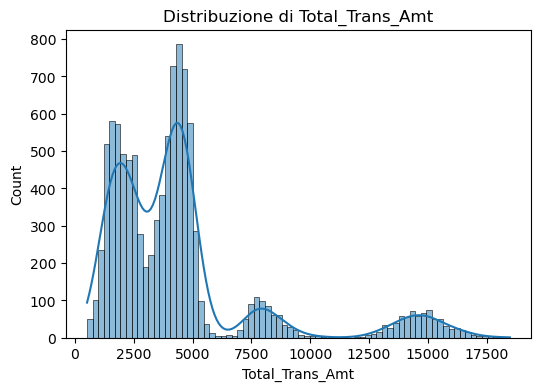

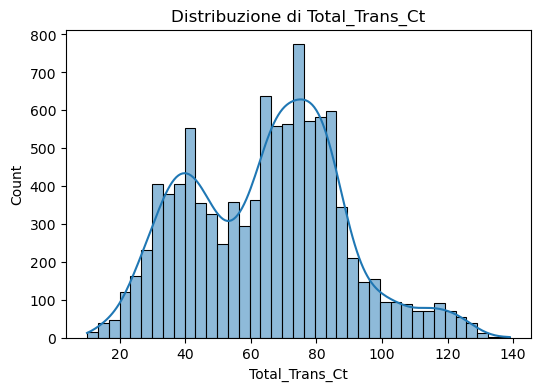

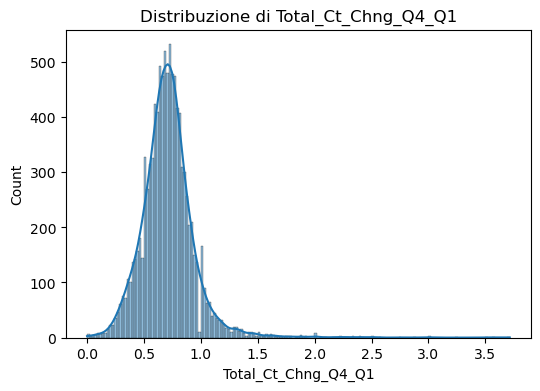

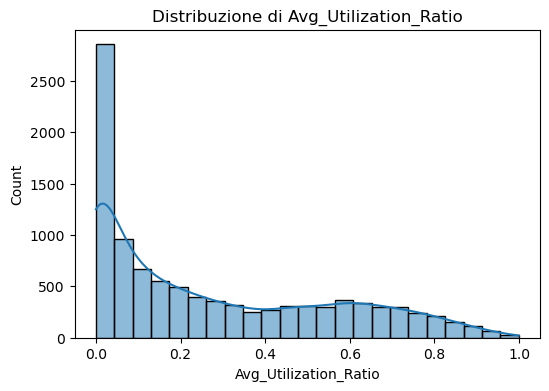

In [14]:
import seaborn as sns
import matplotlib.pyplot as plt

for col in float_col:
    plt.figure(figsize=(6, 4))
    sns.histplot(df[col], kde=True)
    plt.title(f"Distribuzione di {col}")
    plt.show()


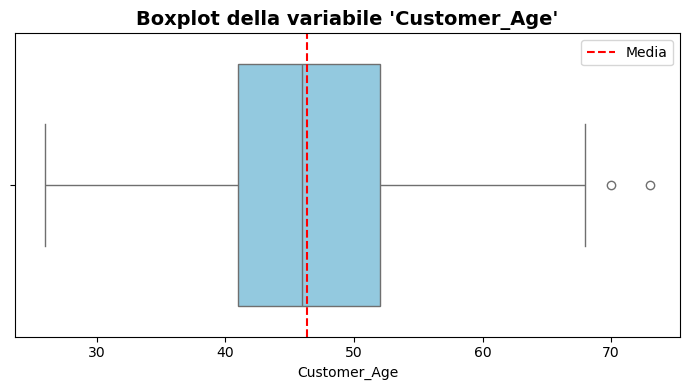

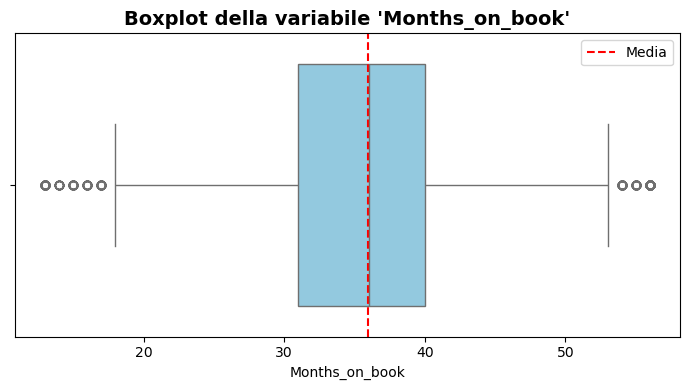

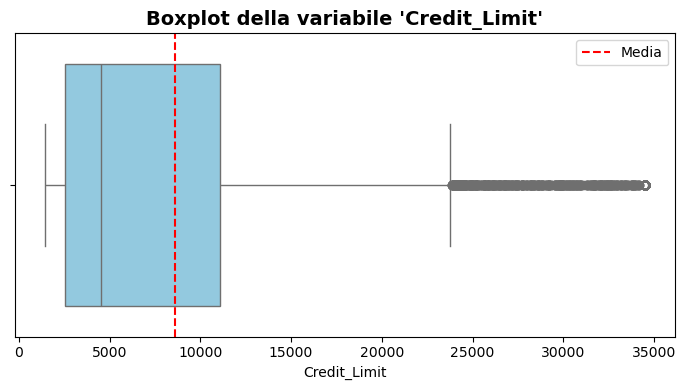

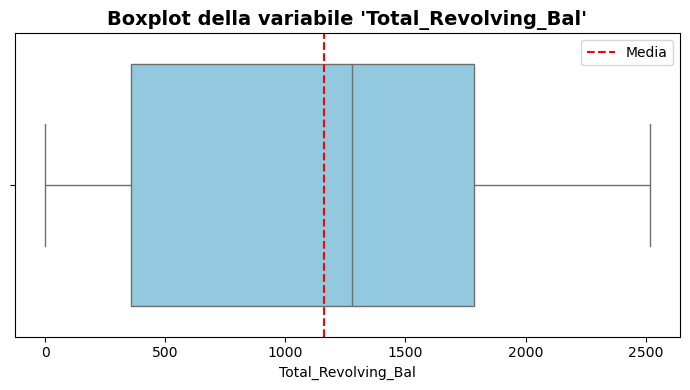

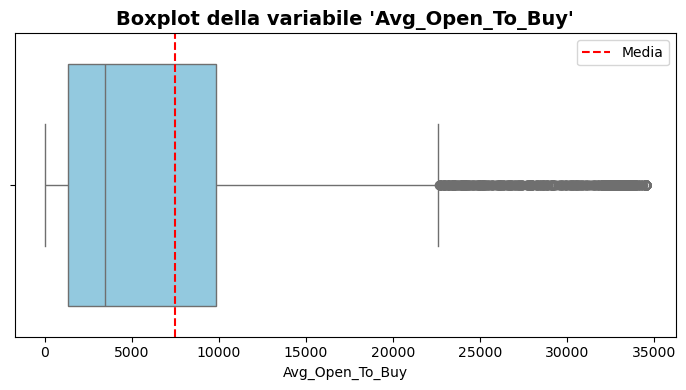

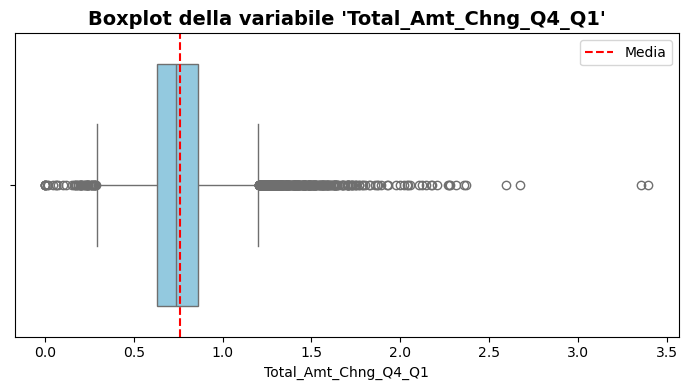

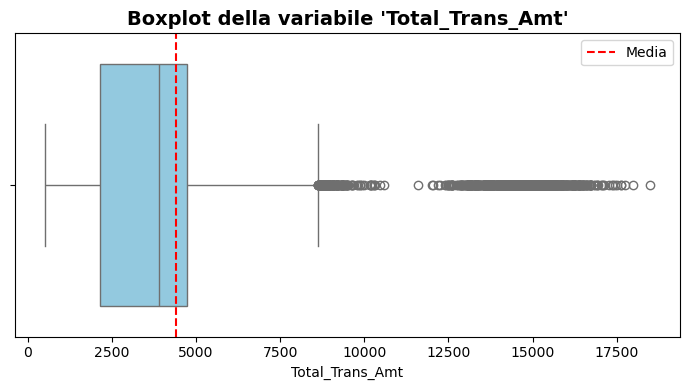

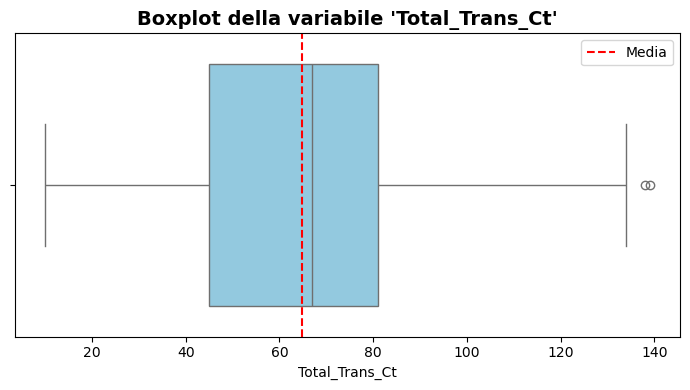

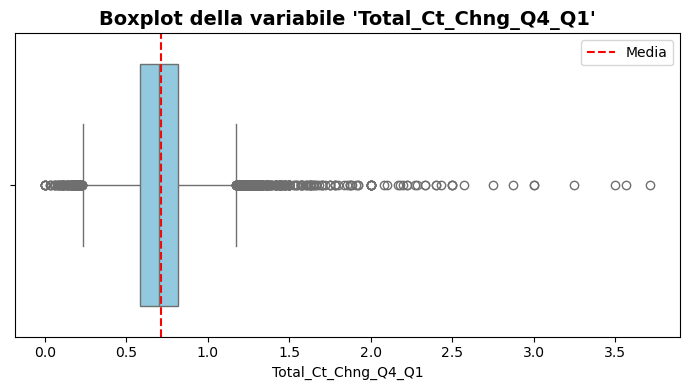

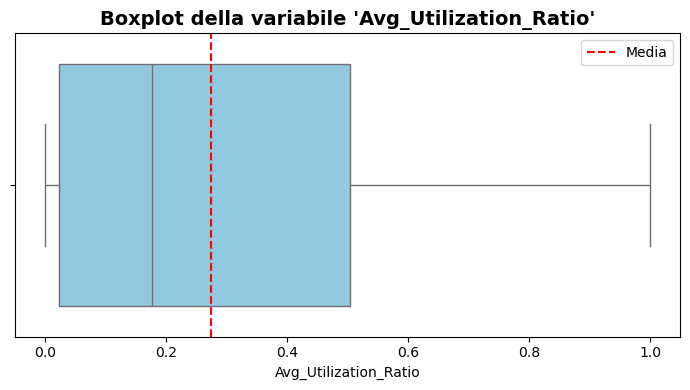

In [74]:
for col in float_col:
    plt.figure(figsize=(7, 4))

    # Boxplot con mediana (inclusa di default)
    sns.boxplot(x=df[col], color='skyblue')

    # Calcola la media
    mean_val = df[col].mean()

    # Aggiungi linea verticale per la media
    plt.axvline(mean_val, color='red', linestyle='--', label='Media')

    # Titolo e asse
    plt.title(f"Boxplot della variabile '{col}'", fontsize=14, fontweight='bold')
    plt.xlabel(col)

    # Legenda per la media
    plt.legend()

    plt.tight_layout()
    plt.show()


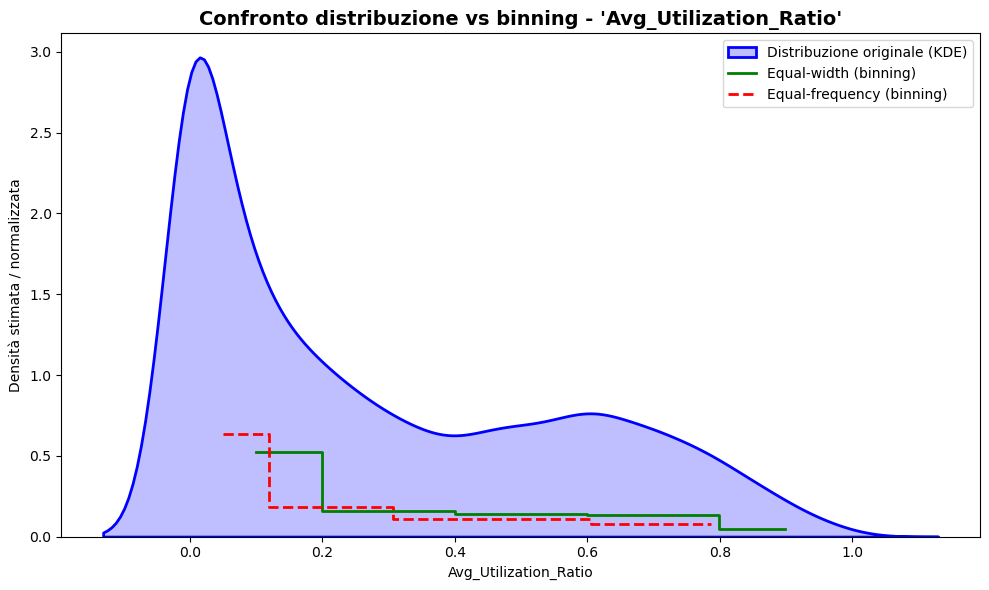

In [84]:
# FLOAT_COL VARS
# 'Customer_Age',
# 'Months_on_book',
# 'Credit_Limit',
# 'Total_Revolving_Bal',
# 'Avg_Open_To_Buy',
# 'Total_Amt_Chng_Q4_Q1',
# 'Total_Trans_Amt',
# 'Total_Trans_Ct',
# 'Total_Ct_Chng_Q4_Q1',
# 'Avg_Utilization_Ratio'

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

col = 'Avg_Utilization_Ratio'  # ← cambia questa per analizzare altre colonne

# Crea un DataFrame temporaneo per lavorare sulla colonna
df_prova = pd.DataFrame()
df_prova[col] = df[col]

# Parametri binning
num_bins_width = 5
num_bins_freq = 5

# Equal-width binning
df_prova['bin_width'] = pd.cut(df[col], bins=num_bins_width)
freq_width = df_prova['bin_width'].value_counts().sort_index()
widths_width = [interval.length for interval in freq_width.index]
density_width = freq_width.values / widths_width
density_width = density_width / density_width.sum()
centers_width = [interval.mid for interval in freq_width.index]

# Equal-frequency binning
df_prova['bin_freq'] = pd.qcut(df[col], q=num_bins_freq, duplicates='drop')
freq_freq = df_prova['bin_freq'].value_counts().sort_index()
widths_freq = [interval.length for interval in freq_freq.index]
density_freq = freq_freq.values / widths_freq
density_freq = density_freq / density_freq.sum()
centers_freq = [interval.mid for interval in freq_freq.index]

# 🎨 Confronto tra distribuzione reale e binning
plt.figure(figsize=(10, 6))

# KDE originale
sns.kdeplot(df[col], fill=True, color='blue', label='Distribuzione originale (KDE)', linewidth=2)

# Frequenze da binning (equal-width)
plt.step(centers_width, density_width, where='mid', color='green', label='Equal-width (binning)', linewidth=2)

# Frequenze da binning (equal-frequency)
plt.step(centers_freq, density_freq, where='mid', color='red', linestyle='--', label='Equal-frequency (binning)', linewidth=2)

# Dettagli grafico
plt.title(f"Confronto distribuzione vs binning - '{col}'", fontsize=14, fontweight='bold')
plt.xlabel(col)
plt.ylabel("Densità stimata / normalizzata")
plt.legend()
plt.tight_layout()
plt.show()



### Analisi per il preprocessing di binning delle variabili continue
- Customer_Age --> equal_width con 6 bin         --> distribuzione Gaussiana bilanciata attorno alla media
- Months_on_book --> equal_width con 9 bin        --> distribuzione Gaussiana bilanciata attorno alla media
- Credit_Limit --> equal_frequency con 7 bin     --> distribuzione Bimodale asimmetrica con coda a dx
- Total_Revolving_Bal --> equal_width con 6 bin    --> distribuzione Bimodale, con buon livello di simmetria attorno alla mediana
- Avg_Open_To_Buy --> equal_frequency con 6 bin    --> distribuzione Bimodale asimmetrica con coda a dx
- Total_Amt_Chng_Q4_Q1 --> equal_frequency con 4 bin    --> distribuzione asimmetrica con coda a dx
- Total_Trans_Amt --> equal_frequency con 8 bin --> distribuzione quadrimodale asimmetrica con coda a dx
- Total_Trans_Ct --> equal_frequency con 8 bin --> distribuzione bimodale asimmetrica con coda a sx
- Total_Ct_Chng_Q4_Q1 --> equal_width con 4 bin --> distribuzione Gaussiana bilanciata attorno alla media
- Avg_Utilization_Ratio --> equal_frequency con 5 bin --> distribuzione bimodale asimmetrica con coda a dx

In [85]:
# Inizializza il dataframe che conterrà tutte le versioni binnate
# df_binned = pd.DataFrame(index=df.index)

# Esempio per una variabile dopo aver scelto il binning migliore
col = 'Avg_Utilization_Ratio'  # nome della variabile
binning_method = 'equal-frequency' # o 'equal-width'

# Numero di bin (puoi personalizzarlo per ogni variabile)
num_bins = 5

if binning_method == 'equal-width':
    df_binned[col + '_bin'] = pd.cut(df[col], bins=num_bins)
elif binning_method == 'equal-frequency':
    df_binned[col + '_bin'] = pd.qcut(df[col], q=num_bins, duplicates='drop')


In [86]:
df_binned

,Customer_Age_bin,Months_on_book_bin,Credit_Limit_bin,Total_Revolving_Bal_bin,Avg_Open_To_Buy_bin,Total_Amt_Chng_Q4_Q1_bin,Total_Trans_Amt_bin,Total_Trans_Ct_bin,Total_Ct_Chng_Q4_Q1_bin,Avg_Utilization_Ratio_bin
0,"(41.667, 49.5]","(36.889, 41.667]","(9579.571, 18085.0]","(419.5, 839.0]","(6958.0, 14910.0]","(0.859, 3.397]","(509.999, 1597.75]","(36.0, 45.0]","(0.928, 1.857]","(-0.001, 0.1]"
1,"(41.667, 49.5]","(41.667, 46.444]","(5719.571, 9579.571]","(839.0, 1258.5]","(6958.0, 14910.0]","(0.859, 3.397]","(509.999, 1597.75]","(9.999, 36.0]","(2.786, 3.714]","(0.1, 0.277]"
2,"(49.5, 57.333]","(32.111, 36.889]","(2713.0, 3652.714]","(-2.517, 419.5]","(1666.0, 3474.0]","(0.859, 3.397]","(1597.75, 2155.5]","(9.999, 36.0]","(1.857, 2.786]","(-0.001, 0.1]"
3,"(33.833, 41.667]","(32.111, 36.889]","(2713.0, 3652.714]","(2097.5, 2517.0]","(2.999, 905.0]","(0.859, 3.397]","(509.999, 1597.75]","(9.999, 36.0]","(1.857, 2.786]","(0.573, 0.999]"
4,"(33.833, 41.667]","(17.778, 22.556]","(3652.714, 5719.571]","(-2.517, 419.5]","(3474.0, 6958.0]","(0.859, 3.397]","(509.999, 1597.75]","(9.999, 36.0]","(1.857, 2.786]","(-0.001, 0.1]"
...,...,...,...,...,...,...,...,...,...,...
10122,"(49.5, 57.333]","(36.889, 41.667]","(3652.714, 5719.571]","(1678.0, 2097.5]","(1666.0, 3474.0]","(0.631, 0.736]","(7626.5, 18484.0]","(89.0, 139.0]","(-0.00371, 0.928]","(0.277, 0.573]"
10123,"(33.833, 41.667]","(22.556, 27.333]","(3652.714, 5719.571]","(2097.5, 2517.0]","(1666.0, 3474.0]","(0.736, 0.859]","(7626.5, 18484.0]","(67.0, 74.0]","(-0.00371, 0.928]","(0.277, 0.573]"
10124,"(41.667, 49.5]","(32.111, 36.889]","(3652.714, 5719.571]","(-2.517, 419.5]","(3474.0, 6958.0]","(0.736, 0.859]","(7626.5, 18484.0]","(58.0, 67.0]","(-0.00371, 0.928]","(-0.001, 0.1]"
10125,"(25.953, 33.833]","(32.111, 36.889]","(3652.714, 5719.571]","(-2.517, 419.5]","(3474.0, 6958.0]","(-0.001, 0.631]","(7626.5, 18484.0]","(58.0, 67.0]","(-0.00371, 0.928]","(-0.001, 0.1]"


In [87]:
nome_file = 'continous_feature_binned.csv'  
df_binned.to_csv(nome_file, index=False, encoding='utf-8')
print(f"✔️ File salvato come: {nome_file}")

✔️ File salvato come: continous_feature_binned.csv


In [78]:
df_prova['bin_width']

0          (37.75, 49.5]
1          (37.75, 49.5]
2          (49.5, 61.25]
3          (37.75, 49.5]
4          (37.75, 49.5]
              ...       
10122      (49.5, 61.25]
10123      (37.75, 49.5]
10124      (37.75, 49.5]
10125    (25.953, 37.75]
10126      (37.75, 49.5]
Name: bin_width, Length: 10127, dtype: category
Categories (4, interval[float64, right]): [(25.953, 37.75] < (37.75, 49.5] < (49.5, 61.25] < (61.25, 73.0]]

In [79]:
df_prova['bin_freq']

0          (41.0, 46.0]
1          (46.0, 52.0]
2          (46.0, 52.0]
3        (25.999, 41.0]
4        (25.999, 41.0]
              ...      
10122      (46.0, 52.0]
10123    (25.999, 41.0]
10124      (41.0, 46.0]
10125    (25.999, 41.0]
10126      (41.0, 46.0]
Name: bin_freq, Length: 10127, dtype: category
Categories (4, interval[float64, right]): [(25.999, 41.0] < (41.0, 46.0] < (46.0, 52.0] < (52.0, 73.0]]

In [15]:
from itertools import combinations

idx_pears_dict = {}

# print("INDICE DI CORRELAZIONE DI PEARSON:\n")

for var1, var2 in combinations(float_col, 2):
    corr = df[var1].corr(df[var2], method='pearson')
    key = f"{var1} - {var2}"
    idx_pears_dict[key] = corr
    #print(f"{key} = {corr:.4f}")


In [16]:
print("COPPIE DI VARIABILI CON INDICE DI PEARSON > 0.5 (in valore assoluto):\n")

for pair, value in idx_pears_dict.items():
    if abs(value) > 0.5:
        print(f"{pair} = {value:.4f}")


COPPIE DI VARIABILI CON INDICE DI PEARSON > 0.5 (in valore assoluto):

Customer_Age - Months_on_book = 0.7889
Credit_Limit - Avg_Open_To_Buy = 0.9960
Total_Revolving_Bal - Avg_Utilization_Ratio = 0.6240
Avg_Open_To_Buy - Avg_Utilization_Ratio = -0.5388
Total_Trans_Amt - Total_Trans_Ct = 0.8072


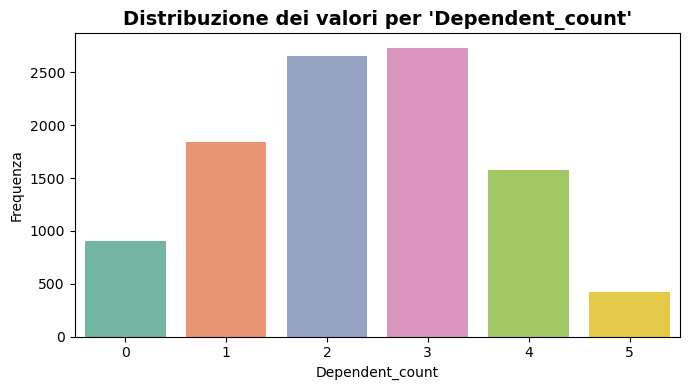

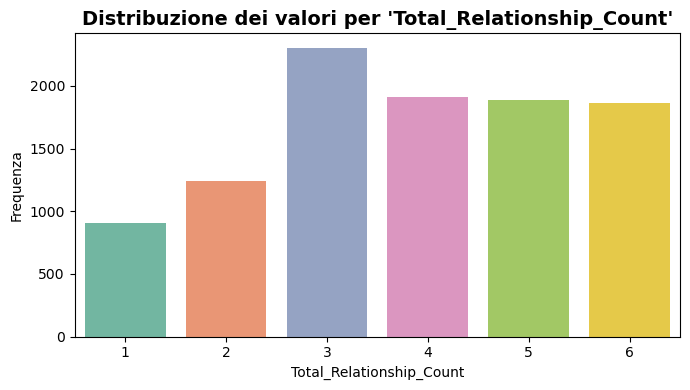

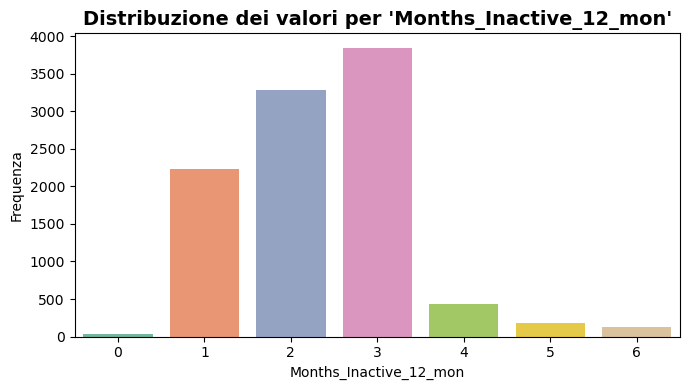

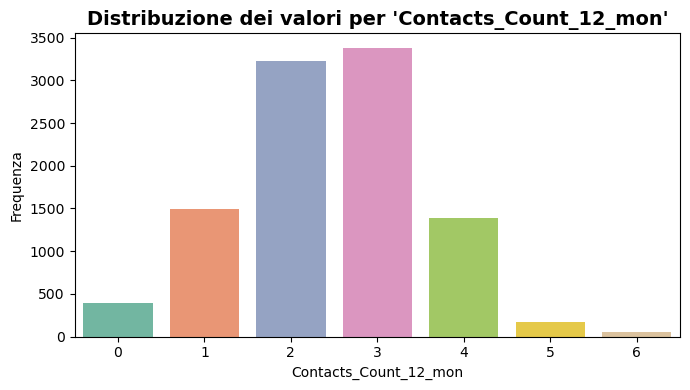

In [17]:
for col in int_col:
    counts = df[col].value_counts().sort_index()
    plt.figure(figsize=(7, 4))
    sns.barplot(x=counts.index, y=counts.values, hue=counts.index,  palette="Set2", legend=False)
    plt.title(f"Distribuzione dei valori per '{col}'", fontsize=14, fontweight='bold')
    plt.xlabel(col)
    plt.ylabel("Frequenza")
    plt.tight_layout()
    plt.show()


In [17]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

# Applica la standardizzazione alle colonne float
df_float_col_std = pd.DataFrame(
    scaler.fit_transform(df[float_col]),
    columns=float_col,
    index=df.index  # manteniamo l'indice originale
)
df_float_col_std 

,Customer_Age,Months_on_book,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,-0.165406,0.384621,0.446622,-0.473422,0.488971,2.623494,-0.959707,-0.973895,3.834003,-0.775882
1,0.333570,1.010715,-0.041367,-0.366667,-0.008486,3.563293,-0.916433,-1.357340,12.608573,-0.616276
2,0.583058,0.008965,-0.573698,-1.426858,-0.445658,8.367214,-0.740982,-1.911206,6.807864,-0.997155
3,-0.789126,-0.241473,-0.585251,1.661686,-0.734100,2.942843,-0.951758,-1.911206,6.807864,1.759686
4,-0.789126,-1.869317,-0.430877,-1.426858,-0.302868,6.455682,-1.056263,-1.570365,7.509325,-0.997155
...,...,...,...,...,...,...,...,...,...,...
10122,0.458314,0.509840,-0.509330,0.844455,-0.584929,-0.259771,3.259358,2.221481,0.608119,0.678714
10123,-0.664382,-1.368442,-0.479181,1.255524,-0.591639,0.201004,1.283475,0.176440,-0.122745,0.856458
10124,-0.290150,0.008965,-0.354626,-1.426858,-0.226632,0.269436,1.732994,-0.207005,0.444305,-0.997155
10125,-2.036565,0.008965,-0.368710,-1.426858,-0.240713,-1.026208,1.174848,-0.121795,0.041070,-0.997155


In [27]:
df_float_std_target = pd.concat([df_float_col_std, df['Attrition_Flag']], axis=1)

In [28]:
df_float_std_target

,Customer_Age,Months_on_book,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Attrition_Flag
0,-0.165406,0.384621,0.446622,-0.473422,0.488971,2.623494,-0.959707,-0.973895,3.834003,-0.775882,Existing Customer
1,0.333570,1.010715,-0.041367,-0.366667,-0.008486,3.563293,-0.916433,-1.357340,12.608573,-0.616276,Existing Customer
2,0.583058,0.008965,-0.573698,-1.426858,-0.445658,8.367214,-0.740982,-1.911206,6.807864,-0.997155,Existing Customer
3,-0.789126,-0.241473,-0.585251,1.661686,-0.734100,2.942843,-0.951758,-1.911206,6.807864,1.759686,Existing Customer
4,-0.789126,-1.869317,-0.430877,-1.426858,-0.302868,6.455682,-1.056263,-1.570365,7.509325,-0.997155,Existing Customer
...,...,...,...,...,...,...,...,...,...,...,...
10122,0.458314,0.509840,-0.509330,0.844455,-0.584929,-0.259771,3.259358,2.221481,0.608119,0.678714,Existing Customer
10123,-0.664382,-1.368442,-0.479181,1.255524,-0.591639,0.201004,1.283475,0.176440,-0.122745,0.856458,Attrited Customer
10124,-0.290150,0.008965,-0.354626,-1.426858,-0.226632,0.269436,1.732994,-0.207005,0.444305,-0.997155,Attrited Customer
10125,-2.036565,0.008965,-0.368710,-1.426858,-0.240713,-1.026208,1.174848,-0.121795,0.041070,-0.997155,Attrited Customer


In [29]:
print(type(df_float_std_target['Attrition_Flag']))
print(df_float_std_target['Attrition_Flag'].shape)

for col in float_col:
    print(f"{col}: {df_float_std_target[col].shape}")


<class 'pandas.core.series.Series'>
(10127,)
Customer_Age: (10127,)
Months_on_book: (10127,)
Credit_Limit: (10127,)
Total_Revolving_Bal: (10127,)
Avg_Open_To_Buy: (10127,)
Total_Amt_Chng_Q4_Q1: (10127,)
Total_Trans_Amt: (10127,)
Total_Trans_Ct: (10127,)
Total_Ct_Chng_Q4_Q1: (10127,)
Avg_Utilization_Ratio: (10127,)


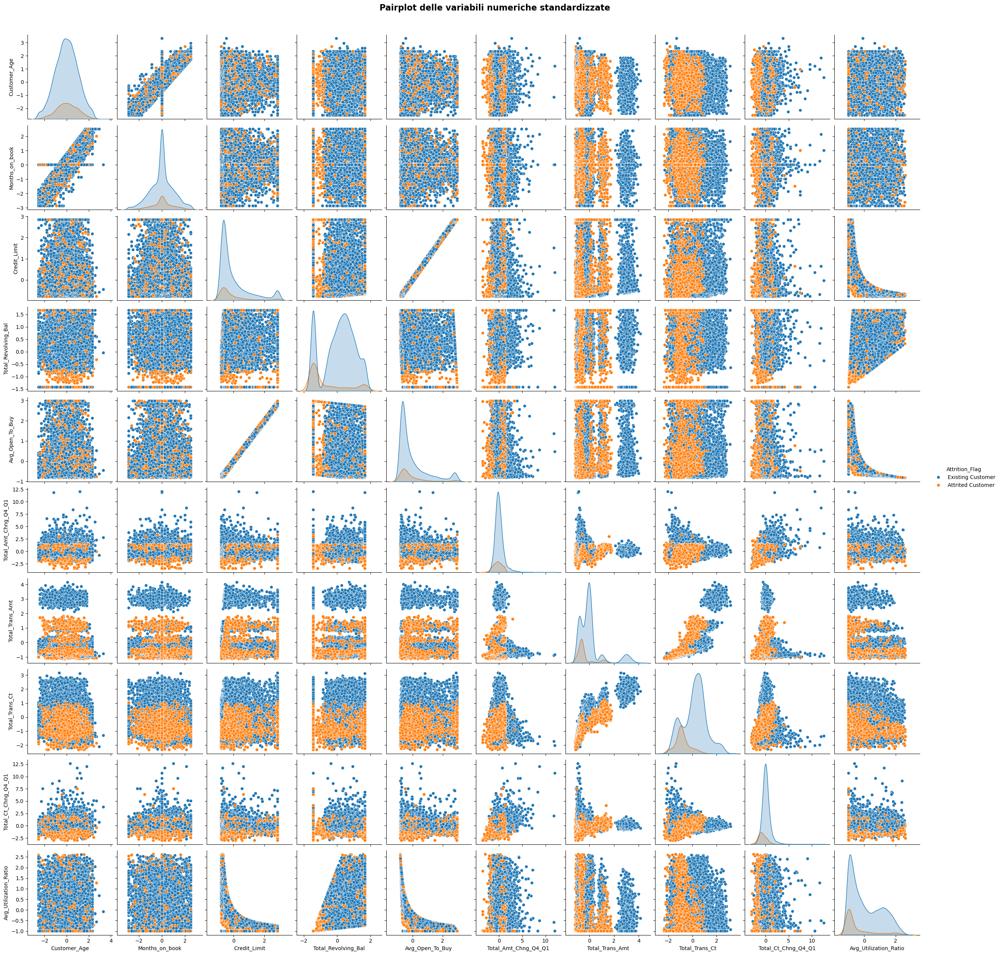

In [31]:
sns.pairplot(df_float_std_target[float_col + ['Attrition_Flag']], hue='Attrition_Flag')
plt.suptitle("Pairplot delle variabili numeriche standardizzate", fontsize=16, fontweight='bold', y=1.02)
plt.show()

### Analisi per il preprocessing di binning delle variabili continue
- Customer_Age --> equal_width con 6 bin         
- Months_on_book --> equal_width con 9 bin        
- Credit_Limit --> equal_frequency con 7 bin     
- Total_Revolving_Bal --> equal_width con 6 bin   
- Avg_Open_To_Buy --> equal_frequency con 6 bin    
- Total_Amt_Chng_Q4_Q1 --> equal_frequency con 4 bin    
- Total_Trans_Amt --> equal_frequency con 8 bin 
- Total_Trans_Ct --> equal_frequency con 8 bin 
- Total_Ct_Chng_Q4_Q1 --> equal_width con 4 bin 
- Avg_Utilization_Ratio --> equal_frequency con 5 bin 